# totalVI on thymus 111 data

Zoë Steier

* Run totalVI on all thymus data

## Imports and settings

In [1]:
# Import required packages

import csv
import gzip
import os
import scipy.io
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import torch
import scanpy as sc
import anndata
import copy
import seaborn as sns

import scvi
from scvi.dataset import GeneExpressionDataset, CellMeasurement, AnnDatasetFromAnnData, Dataset10X
from scvi.models import VAE, TOTALVI
from scvi.inference import TotalPosterior, TotalTrainer, Posterior, UnsupervisedTrainer

from scipy.special import softmax
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap

%load_ext autoreload
%autoreload 2
%matplotlib inline

scvi.set_seed(0)

/data/yosef2/users/zsteier/programs/miniconda/envs/scvi_065/lib/python3.7/site-packages/umap/spectral.py:4: NumbaDeprecationWarning: No direct replacement for 'numba.targets' available. Visit https://gitter.im/numba/numba-dev to request help. Thanks!
  import numba.targets


In [2]:
# Set number of available cores for scanpy

sc.settings.n_jobs = 10

In [3]:
# GPU settings

os.environ["CUDA_DEVICE_ORDER"]="PCI_BUS_ID" 
os.environ['CUDA_VISIBLE_DEVICES']='2'

In [4]:
# Plotting settings

colors = ["#3B7EA1", "#FDB515", "#D9661F", "#859438", "#EE1F60", "#00A598"]
sns.set(context="notebook", font_scale=1.3, style="ticks")
plt.rcParams['svg.fonttype'] = 'none'
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['savefig.transparent'] = True
sc.settings._vector_friendly = True
import matplotlib.colors as mcolors
DPI = 300

In [5]:
# Set save path

save_path = '/data/yosef2/users/zsteier/TotalSeq/20190814_BioLegend_ZRS08/analysis/totalVI_thymus/thymus111_allbatches_stable/'

## Load data
Data were filtered separately in Berkeley and BioLegend cohorts. Varibale genes were selected from both using seurat v3 HVG method implemented in scVI, and additional genes of interested were included (total 5,125 genes).

In [6]:
# Load data as anndata objects
# Data was pre-filtered in Filtering_thymus111.ipynb

dataset_Berkeley = anndata.read(save_path + "Berkeley_111.h5ad")
dataset_BioLegend = anndata.read(save_path + "BioLegend_111.h5ad")

In [7]:
dataset_Berkeley

AnnData object with n_obs × n_vars = 36058 × 16548
    obs: 'batch_indices', 'percent_mito', 'n_counts', 'n_genes', 'n_protein_counts', 'n_proteins'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'encode', 'ofinterest', 'hvg_encode', 'hvg_plus'
    uns: 'protein_names'
    obsm: 'protein_expression'

In [8]:
dataset_BioLegend

AnnData object with n_obs × n_vars = 35984 × 16611
    obs: 'batch_indices', 'percent_mito', 'n_counts', 'n_genes', 'n_protein_counts', 'n_proteins'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'encode', 'ofinterest', 'hvg_encode', 'hvg_plus'
    uns: 'protein_names'
    obsm: 'protein_expression'

## Prepare dataset for totalVI

### Filter proteins and genes

In [9]:
# Filter unwanted proteins (HTO)
keep_pro_111 = np.array([not p.startswith("HTO") for p in dataset_Berkeley.uns["protein_names"]])

In [10]:
# Filter out hashtags and isotype controls
dataset_Berkeley.obsm["protein_expression"] = dataset_Berkeley.obsm["protein_expression"][:, keep_pro_111]
dataset_Berkeley.uns["protein_names"] = dataset_Berkeley.uns["protein_names"][keep_pro_111]
dataset_BioLegend.obsm["protein_expression"] = dataset_BioLegend.obsm["protein_expression"][:, keep_pro_111]
dataset_BioLegend.uns["protein_names"] = dataset_BioLegend.uns["protein_names"][keep_pro_111]

In [11]:
# Find highly variable genes (plus genes encoding proteins and other genes of interest) and use for totalVI
hvg_Berkeley = dataset_Berkeley.var["hvg_plus"]
hvg_BioLegend = dataset_BioLegend.var["hvg_plus"]
dataset_BioLegend.var["hvg_plus"].sum()

5125

### Make totalVI dataset object

In [12]:
# Berkeley data

dataset_totalVI_Berkeley = AnnDatasetFromAnnData(ad = dataset_Berkeley[:, hvg_Berkeley],
                                                cell_measurements_col_mappings = {"protein_expression":"protein_names"})
dataset_totalVI_Berkeley

/data/yosef2/users/zsteier/programs/miniconda/envs/scvi_065/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


[2023-06-17 09:22:20,016] INFO - scvi.dataset.dataset | Remapping labels to [0,N]
[2023-06-17 09:22:20,019] INFO - scvi.dataset.dataset | Remapping batch_indices to [0,N]
[2023-06-17 09:22:22,629] INFO - scvi.dataset.dataset | Computing the library size for the new data
[2023-06-17 09:22:22,991] INFO - scvi.dataset.dataset | Downsampled from 36058 to 36058 cells


GeneExpressionDataset object with n_cells x nb_genes = 36058 x 5125
    gene_attribute_names: 'gene_names', 'feature_types', 'ofinterest', 'hvg_plus', 'highly_variable', 'gene_ids', 'encode', 'hvg_encode', 'n_cells'
    cell_attribute_names: 'n_genes', 'n_counts', 'n_proteins', 'labels', 'protein_expression', 'batch_indices', 'n_protein_counts', 'local_vars', 'percent_mito', 'local_means'
    cell_categorical_attribute_names: 'labels', 'batch_indices'
    cell_measurements_col_mappings: {'protein_expression': 'protein_names'}

In [13]:
# BioLegend data

dataset_totalVI_BioLegend = AnnDatasetFromAnnData(ad = dataset_BioLegend[:, hvg_BioLegend],
                                                cell_measurements_col_mappings = {"protein_expression":"protein_names"})
dataset_totalVI_BioLegend

[2023-06-17 09:22:25,307] INFO - scvi.dataset.dataset | Remapping labels to [0,N]
[2023-06-17 09:22:25,310] INFO - scvi.dataset.dataset | Remapping batch_indices to [0,N]
[2023-06-17 09:22:27,776] INFO - scvi.dataset.dataset | Computing the library size for the new data
[2023-06-17 09:22:28,136] INFO - scvi.dataset.dataset | Downsampled from 35984 to 35984 cells


GeneExpressionDataset object with n_cells x nb_genes = 35984 x 5125
    gene_attribute_names: 'gene_names', 'feature_types', 'ofinterest', 'hvg_plus', 'highly_variable', 'gene_ids', 'encode', 'hvg_encode', 'n_cells'
    cell_attribute_names: 'n_genes', 'n_counts', 'n_proteins', 'labels', 'protein_expression', 'batch_indices', 'n_protein_counts', 'local_vars', 'percent_mito', 'local_means'
    cell_categorical_attribute_names: 'labels', 'batch_indices'
    cell_measurements_col_mappings: {'protein_expression': 'protein_names'}

In [14]:
# Concatenate two datasets into one

dataset = GeneExpressionDataset()
dataset.populate_from_datasets(
    [copy.deepcopy(dataset_totalVI_Berkeley), copy.deepcopy(dataset_totalVI_BioLegend)],
)

[2023-06-17 09:22:28,865] INFO - scvi.dataset.dataset | Merging datasets. Input objects are modified in place.
[2023-06-17 09:22:28,867] INFO - scvi.dataset.dataset | Gene names and cell measurement names are assumed to have a non-null intersection between datasets.
[2023-06-17 09:22:28,877] INFO - scvi.dataset.dataset | Keeping 5125 genes
[2023-06-17 09:22:31,852] INFO - scvi.dataset.dataset | Computing the library size for the new data
[2023-06-17 09:22:32,434] INFO - scvi.dataset.dataset | Remapping labels to [0,N]
[2023-06-17 09:22:32,438] INFO - scvi.dataset.dataset | Remapping batch_indices to [0,N]
[2023-06-17 09:22:35,344] INFO - scvi.dataset.dataset | Computing the library size for the new data
[2023-06-17 09:22:35,882] INFO - scvi.dataset.dataset | Remapping labels to [0,N]
[2023-06-17 09:22:35,885] INFO - scvi.dataset.dataset | Remapping batch_indices to [0,N]
[2023-06-17 09:22:38,231] INFO - scvi.dataset.dataset | Remapping labels to [0,N]
[2023-06-17 09:22:38,236] INFO - s

In [15]:
dataset

GeneExpressionDataset object with n_cells x nb_genes = 72042 x 5125
    gene_attribute_names: 'gene_names', 'feature_types', 'ofinterest', 'hvg_plus', 'highly_variable', 'gene_ids', 'encode', 'hvg_encode', 'n_cells'
    cell_attribute_names: 'n_genes', 'n_counts', 'n_proteins', 'labels', 'protein_expression', 'batch_indices', 'n_protein_counts', 'local_vars', 'percent_mito', 'local_means'
    cell_categorical_attribute_names: 'labels', 'batch_indices'
    cell_measurements_col_mappings: {'protein_expression': 'protein_names'}

In [16]:
# How many batches after merging? 11 from Berkeley, 8 from BioLegend (they are retained)
dataset.n_batches

19

## Run totalVI model

In [17]:
# Prepare totalVI model

totalvae = TOTALVI(dataset.nb_genes, 
                   len(dataset.protein_names),
                   n_latent = 20, 
                   n_batch=dataset.n_batches,
                  )

use_cuda = True
lr = 4e-3
n_epochs = 500

early_stopping_kwargs = {
    "early_stopping_metric": "elbo",
    "save_best_state_metric": "elbo",
    "patience": 45,
    "threshold": 0,
    "reduce_lr_on_plateau": True,
    "lr_patience": 30,
    "lr_factor": 0.6,
    "posterior_class": TotalPosterior,
}

In [18]:
# Load a saved model

totalvae.load_state_dict(torch.load("vae_54kWU.pt"))
totalvae.eval()

TOTALVI(
  (encoder): EncoderTOTALVI(
    (encoder): FCLayers(
      (fc_layers): Sequential(
        (Layer 0): Sequential(
          (0): Linear(in_features=5255, out_features=256, bias=True)
          (1): BatchNorm1d(256, eps=0.001, momentum=0.01, affine=True, track_running_stats=True)
          (2): ReLU()
          (3): Dropout(p=0.2, inplace=False)
        )
      )
    )
    (z_encoder): Sequential(
      (0): Linear(in_features=256, out_features=256, bias=True)
      (1): BatchNorm1d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
      (3): Dropout(p=0.2, inplace=False)
    )
    (z_mean_encoder): Linear(in_features=256, out_features=20, bias=True)
    (z_var_encoder): Linear(in_features=256, out_features=20, bias=True)
    (l_gene_encoder): Sequential(
      (0): Linear(in_features=256, out_features=256, bias=True)
      (1): BatchNorm1d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
      (3): Dr

In [19]:
trainer = TotalTrainer(
    totalvae,
    dataset,
    train_size=0.95,
    test_size=0.05,
    use_cuda=use_cuda,
    frequency=1,
    data_loader_kwargs={"batch_size": 256, "pin_memory":False},
    early_stopping_kwargs=early_stopping_kwargs,
    n_iter_kl_warmup=54000,
    n_epochs_kl_warmup=None,
)

In [20]:
# # Train a new model

# trainer.train(lr=lr, n_epochs=n_epochs)

In [21]:
# Save the trained model

# torch.save(trainer.model.state_dict(), "vae_54kWU.pt")

## Generate and save model outputs

### Generate model outputs

In [23]:
# create posterior on full data

full_posterior = trainer.create_posterior(
    totalvae, dataset, indices=np.arange(len(dataset)), type_class=TotalPosterior
)

In [24]:
# extract latent space

latent_mean, batch_index, label, library_gene = full_posterior.sequential().get_latent()

In [25]:
# calculate protein background probabilites

def sigmoid(x):
    return 1 / (1 + np.exp(-x))

# Number of Monte Carlo samples to average over
n_samples = 25 

# Probability of background
py_mixing = np.mean(sigmoid(
    full_posterior.sequential().get_sample_mixing(n_samples=n_samples, give_mean=False)
), axis=-1)
protein_foreground_prob = pd.DataFrame(
    data=(1 - py_mixing), columns=dataset.protein_names
)

In [26]:
# denoised data

denoised_genes, denoised_proteins = full_posterior.sequential().get_normalized_denoised_expression(
    n_samples=n_samples, give_mean=True, transform_batch = [0, 3, 11, 15]
) # tranform batch puts all denoised samples into the same batch, here choose WT batches
# input a list to average over all batches if give_mean = True

In [28]:
# concatenate raw anndatasets

adata_total = anndata.AnnData.concatenate(dataset_Berkeley[:, hvg_Berkeley], dataset_BioLegend[:, hvg_BioLegend])

In [29]:
adata_total

AnnData object with n_obs × n_vars = 72042 × 5125
    obs: 'batch_indices', 'percent_mito', 'n_counts', 'n_genes', 'n_protein_counts', 'n_proteins', 'batch'
    var: 'gene_ids', 'feature_types', 'highly_variable', 'encode', 'ofinterest', 'hvg_encode', 'hvg_plus', 'n_cells-0', 'n_cells-1'
    obsm: 'protein_expression'

In [30]:
adata_total.obsm["protein_expression"].shape

(72042, 111)

In [31]:
# Create posterior anndata object

post_adata = adata_total.copy()
post_adata.obsm["X_totalVI"] = latent_mean # add latent mean

# Add denoised counts to anndata
post_adata.obsm["denoised_proteins"] = denoised_proteins
post_adata.obsm["denoised_genes"] = denoised_genes

# Add metadata
post_adata.obs["batch_indices"] = dataset.batch_indices.astype(str)

# Add raw protein counts
post_adata.uns["protein_names"] = dataset.protein_names
post_adata.obsm["protein_expression"] = dataset.protein_expression

# Add to anndata the gene and protein names
post_adata.uns["totalVI_genes"] = dataset.gene_names
post_adata.uns["totalVI_proteins"] = dataset.protein_names

In [32]:
post_adata

AnnData object with n_obs × n_vars = 72042 × 5125
    obs: 'batch_indices', 'percent_mito', 'n_counts', 'n_genes', 'n_protein_counts', 'n_proteins', 'batch'
    var: 'gene_ids', 'feature_types', 'highly_variable', 'encode', 'ofinterest', 'hvg_encode', 'hvg_plus', 'n_cells-0', 'n_cells-1'
    uns: 'protein_names', 'totalVI_genes', 'totalVI_proteins'
    obsm: 'protein_expression', 'X_totalVI', 'denoised_proteins', 'denoised_genes'

In [33]:
# Run UMAP on latent space
sc.pp.neighbors(post_adata, use_rep="X_totalVI", n_neighbors=30, metric="correlation") # use latent mean for similarity metric
sc.tl.umap(post_adata, min_dist=0.1)

In [35]:
# Cluster at multiple resolutions
sc.tl.leiden(post_adata, key_added="leiden_totalVI_res1.4", resolution=1.4)
sc.tl.leiden(post_adata, key_added="leiden_totalVI_res1.0", resolution=1)
sc.tl.leiden(post_adata, key_added="leiden_totalVI_res0.6", resolution=0.6)

... storing 'batch_indices' as categorical


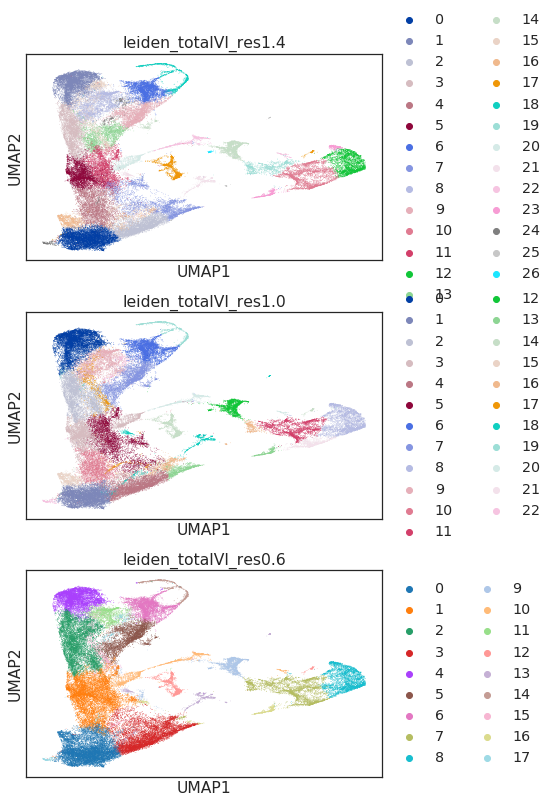

In [36]:
# Plot clusters
sc.pl.umap(
    post_adata, 
    color=["leiden_totalVI_res1.4", "leiden_totalVI_res1.0", "leiden_totalVI_res0.6"], 
    ncols = 1
)

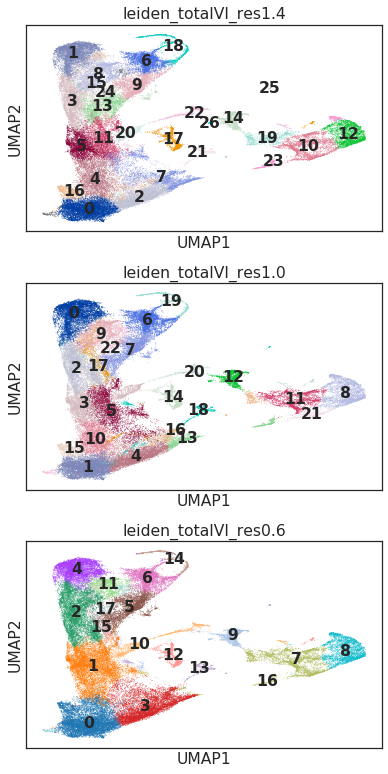

In [37]:
# Plot clusters on data
sc.pl.umap(
    post_adata, 
    color=["leiden_totalVI_res1.4", "leiden_totalVI_res1.0", "leiden_totalVI_res0.6"], 
    ncols = 1,
    legend_loc = "on data"
)

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


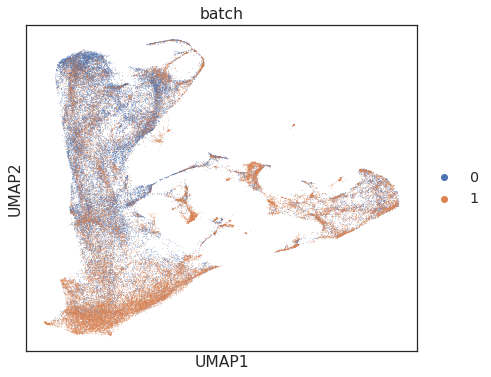

In [38]:
# Plot batches (Berkeley, BioLegend)
fig, ax = plt.subplots(figsize=(7, 6))
sc.pl.umap(
    post_adata, 
    color=["batch"], 
    ax=ax
)

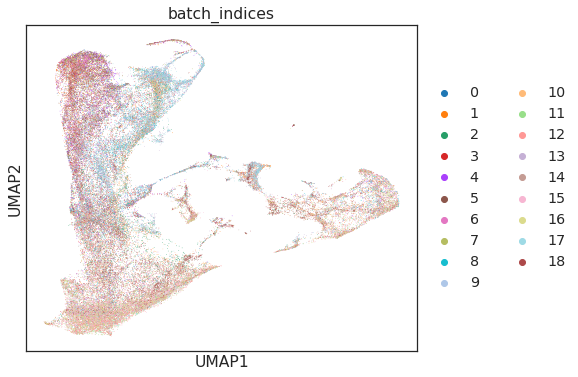

In [39]:
# Plot samples (19)
fig, ax = plt.subplots(figsize=(7, 6))
sc.pl.umap(
    post_adata, 
    color=["batch_indices"], 
    ax=ax
)

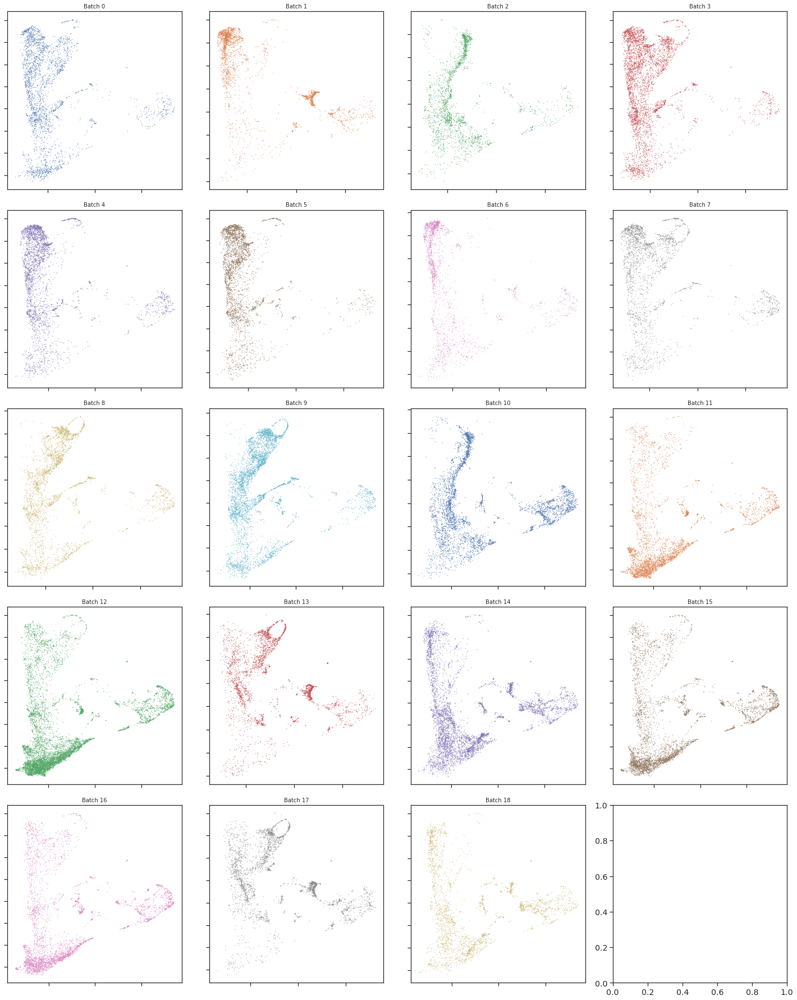

In [40]:
# Plot each sample (mouse) individually
prop_cycle = plt.rcParams['axes.prop_cycle']
colors = prop_cycle.by_key()['color']

fig, ax = plt.subplots(5, 4, figsize=(20, 25))
batches = dataset.batch_indices.ravel()
for b in np.unique(batches):
    ax.flat[b].scatter(post_adata.obsm["X_umap"][batches==b, 0], post_adata.obsm["X_umap"][batches==b, 1], s=.1, color = colors[b%10])
    ax.flat[b].set_title("Batch " + str(b), fontsize = 10)
    ax.flat[b].set_yticklabels([])
    ax.flat[b].set_xticklabels([])
plt.tight_layout()

### Add protein denoised counts to anndata

In [42]:
# Add denoised protein counts to adata.obs for plotting
for i, p in enumerate(dataset.protein_names):
    post_adata.obs["{}_fore_prob".format(p)] = protein_foreground_prob[p].values
    post_adata.obs["{}".format(p)] = denoised_proteins[:, i] # each protein's count is its denoised value

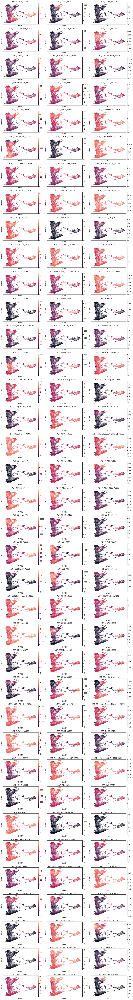

In [56]:
# Plot denoised protein counts
sc.pl.umap(
    post_adata, 
    color=dataset.protein_names, 
    ncols=3,
    vmax = "p99.5"
)

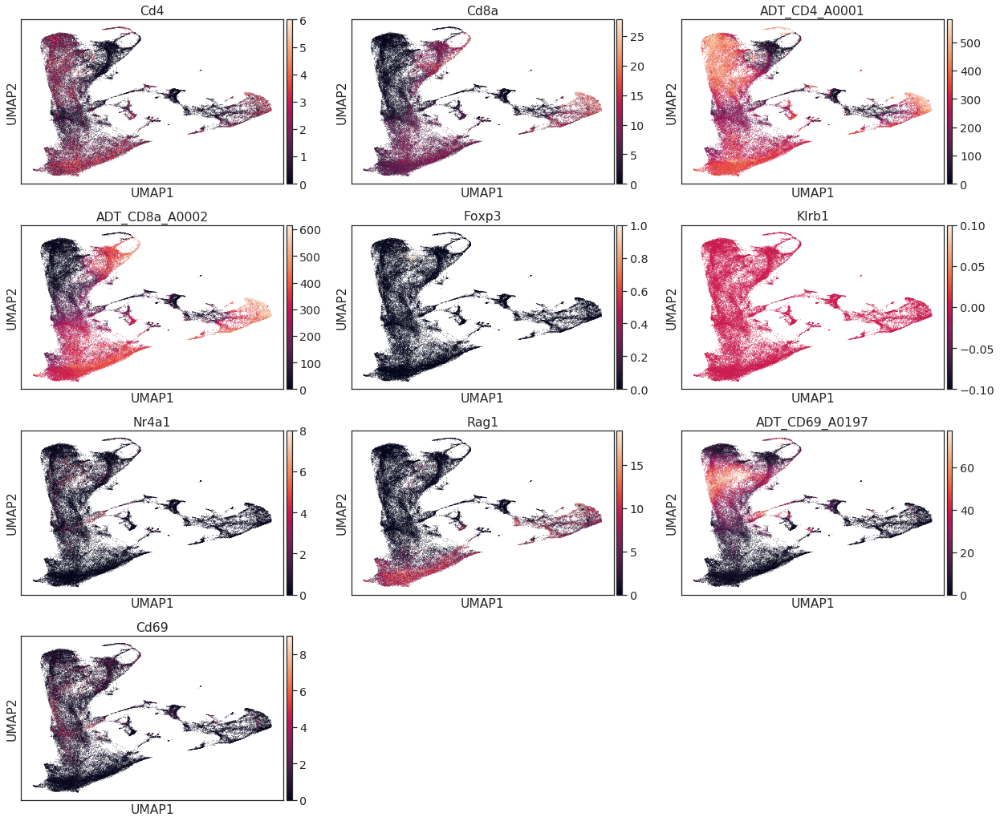

In [49]:
# Plot selected markers
sc.pl.umap(
    post_adata, 
    color=["Cd4", "Cd8a", "ADT_CD4_A0001", "ADT_CD8a_A0002", "Foxp3", "Klrb1", "Nr4a1", "Rag1", "ADT_CD69_A0197", "Cd69"],
    ncols = 3,
    vmax = "p99.5"
)

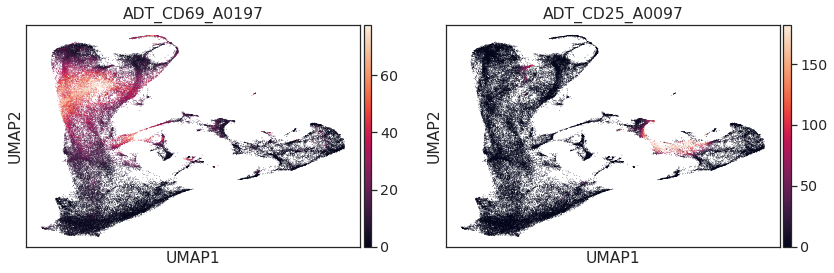

In [50]:
# Plot additional markers
sc.pl.umap(
    post_adata, 
    color=["ADT_CD69_A0197", "ADT_CD25_A0097"],
    ncols = 3,
    vmax = "p99.5"
)

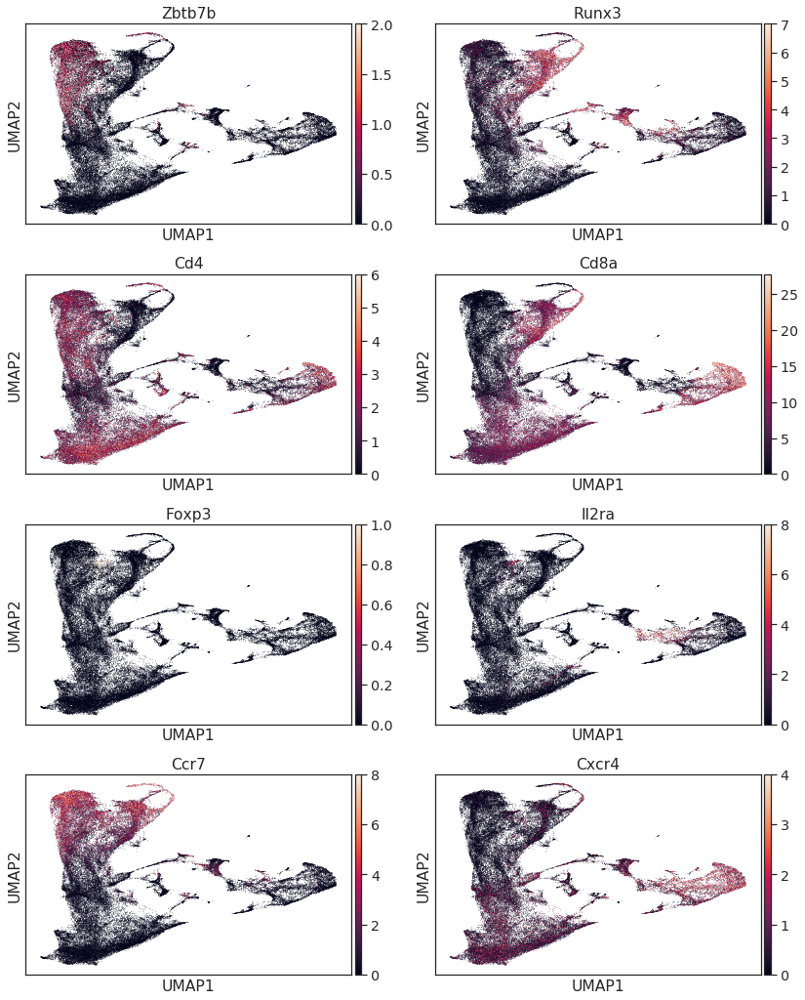

In [51]:
# Plot additional markers
sc.pl.umap(
    post_adata, 
    color=["Zbtb7b", "Runx3", "Cd4", "Cd8a", "Foxp3", "Il2ra", "Ccr7", "Cxcr4"], 
    ncols = 2,
    vmax = "p99.5"
)

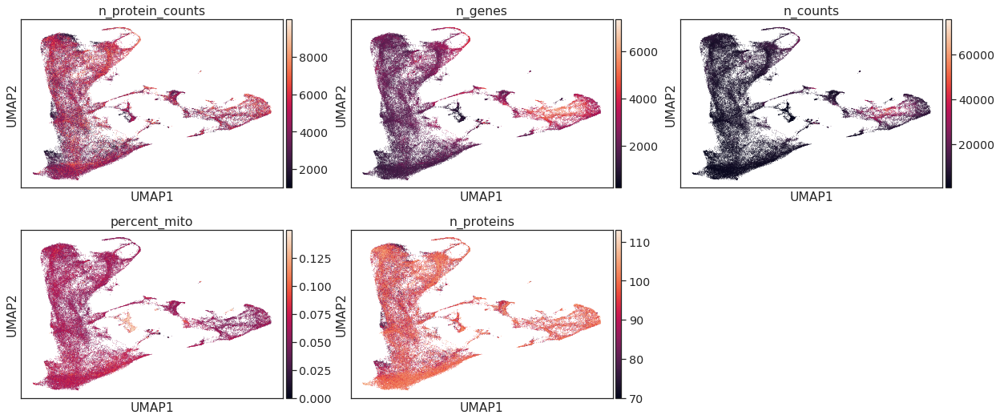

In [53]:
# Plot metadata
sc.pl.umap(
    post_adata, 
    color=["n_protein_counts", 'n_genes', "n_counts", "percent_mito", "n_proteins"],
    ncols = 3
)

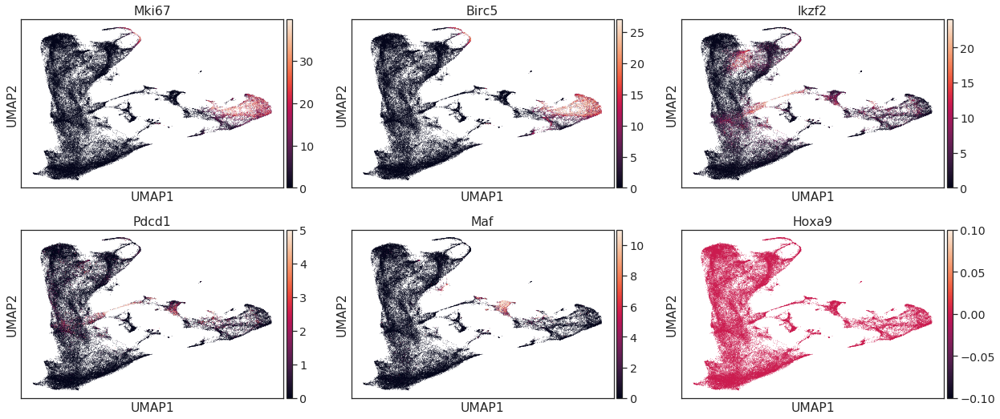

In [54]:
# Find clusters to remove based on marker expression
sc.pl.umap(
    post_adata, 
    color=["Mki67", "Birc5", "Ikzf2", "Pdcd1", "Maf", "Hoxa9"],
    ncols = 3,
    vmax = "p99.5"
)

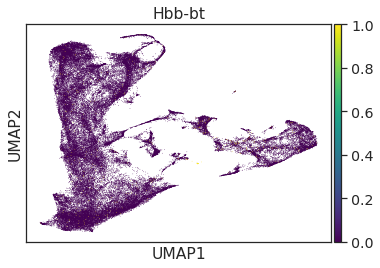

In [82]:
sc.pl.umap(
    post_adata, 
    color=["Hbb-bt"],
    ncols = 3,
    vmax = "p99.5",
    cmap = "viridis"
)

## DE to find positive selecting clusters

In [73]:
de_res_onevall, de_clust_onevall = full_posterior.one_vs_all_degenes(
    cell_labels=np.array((post_adata.obs["leiden_totalVI_res0.6"])).astype("int").ravel(),
    n_samples=5000,
    use_permutation=False,
    delta=0.2,
    mode="change"
)

In [74]:
all_de = pd.concat(de_res_onevall) 

In [75]:
de_clust_onevall

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17]

In [85]:
# View RNA results for a given cluster
cluster = 17
RNA_de_filt = all_de.loc[all_de['non_zeros_proportion1'] > 0.1] # select non_zeros_proportion1 > 0.1 for RNA
RNA_de_filt = RNA_de_filt.loc[RNA_de_filt['lfc_mean'] > 0] # select mean > 0 (positive fold change)
RNA_de_filt = RNA_de_filt.loc[RNA_de_filt['bayes_factor'] > 0.7] # select bayes_factor > 0.7
RNA_de_filt = RNA_de_filt.sort_values(by = "lfc_median", ascending = False) # sort by median LFC
RNA_de_filt = RNA_de_filt[["ADT" not in x for x in np.array(RNA_de_filt.index)]] # exclude proteins

RNA_de_filt.iloc[(RNA_de_filt[["clusters"]] == cluster).values.ravel(), :][:30]

,proba_de,proba_not_de,bayes_factor,scale1,scale2,lfc_mean,lfc_median,lfc_std,lfc_min,lfc_max,raw_mean1,raw_mean2,non_zeros_proportion1,non_zeros_proportion2,raw_normalized_mean1,raw_normalized_mean2,clusters
Gm15340,0.963778,0.036222,3.281202,0.000214,0.000169,1.954495,2.148634,3.852906,-9.993869,12.638969,0.419498,0.179822,0.280650,0.126140,1.934599,0.993344,17
Tctex1d1,0.965579,0.034421,3.334071,0.000118,0.000102,2.023359,2.025580,4.227923,-11.041091,14.278055,0.227474,0.120549,0.171344,0.092735,0.781566,0.555369,17
Rag1,0.967781,0.032219,3.402439,0.001796,0.001302,1.814051,1.913568,4.436433,-11.269681,13.598221,3.695716,1.986128,0.611521,0.370364,16.862810,10.146856,17
Gm44175,0.954373,0.045627,3.040546,0.000220,0.000156,1.906811,1.881646,3.526706,-12.053363,12.744829,0.468242,0.214909,0.292467,0.146584,1.836783,1.121135,17
Slc7a11,0.960776,0.039224,3.198465,0.000096,0.000088,1.741356,1.868903,3.832603,-9.427203,13.329731,0.212703,0.151279,0.149188,0.093463,0.766924,0.677252,17
Fam101b,0.964779,0.035221,3.310252,0.000038,0.000032,1.716314,1.762678,4.099440,-11.497537,14.021968,0.140325,0.097639,0.101920,0.062566,0.181246,0.176048,17
Zbtb7b,0.957374,0.042626,3.111740,0.000050,0.000041,1.663849,1.725119,3.450784,-9.240450,11.413350,0.211226,0.089470,0.134417,0.069768,0.329188,0.211985,17
P2rx1,0.968581,0.031419,3.428424,0.000059,0.000057,1.613986,1.647408,4.405963,-13.340738,16.268810,0.134417,0.103132,0.109306,0.078652,0.434492,0.359488,17
Rag2,0.964179,0.035821,3.292728,0.000160,0.000134,1.528515,1.557709,3.959036,-10.416081,13.227737,0.320532,0.225461,0.239291,0.147818,1.368698,0.847153,17
S1pr1,0.962377,0.037623,3.241802,0.000187,0.000160,1.503815,1.550877,4.366729,-10.572904,15.053982,0.700148,0.365768,0.277696,0.170420,1.084371,0.792432,17


In [83]:
# View protein results for a given cluster
cluster = 5
protein_de_filt = all_de[["ADT" in x for x in np.array(all_de.index)]] 
protein_de_filt = protein_de_filt.loc[protein_de_filt['lfc_mean'] > 0] 
protein_de_filt = protein_de_filt.loc[protein_de_filt['bayes_factor'] > 0.7] 
protein_de_filt = protein_de_filt.sort_values(by = "lfc_median", ascending = False) 
protein_de_filt.iloc[(protein_de_filt[["clusters"]] == cluster).values.ravel(), :].iloc[0:10,:]

,proba_de,proba_not_de,bayes_factor,scale1,scale2,lfc_mean,lfc_median,lfc_std,lfc_min,lfc_max,raw_mean1,raw_mean2,non_zeros_proportion1,non_zeros_proportion2,raw_normalized_mean1,raw_normalized_mean2,clusters
ADT_CD274(B7-H1_PD-L1)_A0190,0.826496,0.173504,1.560994,9.385664,6.677438,0.625296,0.482701,1.312125,-5.602428,6.039599,7.663054,6.474630,0.916796,0.877104,NaN,NaN,5
ADT_TCRbchain_A0120,0.692415,0.307585,0.811436,27.405031,11.973264,1.545383,0.349625,2.784637,-7.512841,8.087271,18.743549,11.082066,0.842750,0.800809,NaN,NaN,5
ADT_TCRVb5.1_5.2_A0354,0.744447,0.255553,1.069210,89.265938,55.703979,0.956433,0.302504,3.683686,-10.287939,10.079717,94.599846,50.717964,0.985294,0.941966,NaN,NaN,5
ADT_CD200(OX2)_A0079,0.855513,0.144487,1.778514,11.293020,13.957431,0.864868,0.289335,2.588940,-8.977953,7.321330,11.142544,12.976341,0.992647,0.982874,NaN,NaN,5
ADT_CD86_A0200,0.718631,0.281369,0.937682,5.686639,3.838849,0.762088,0.269755,2.286901,-6.751639,6.683160,5.076625,4.017530,0.920666,0.881039,NaN,NaN,5
ADT_CD48_A0429,0.721033,0.278967,0.949589,26.409634,22.915714,0.244565,0.225526,1.052871,-6.516662,7.898855,18.879128,27.103779,0.974974,0.973091,NaN,NaN,5
ADT_CD122(IL-2Rb)_A0227,0.683210,0.316790,0.768563,2.708445,2.639219,0.504944,0.141940,1.977577,-8.946899,4.856205,3.451238,2.840209,0.907895,0.798911,NaN,NaN,5
ADT_CD90.2_A0075,0.762457,0.237543,1.166200,203.176392,224.309418,0.560205,0.139964,2.104769,-11.152724,10.924487,131.447372,291.993164,0.961558,0.913144,NaN,NaN,5
ADT_I-A-I-E_A0117,0.684811,0.315189,0.775970,16.669355,15.821121,0.427767,0.039915,3.131767,-11.050201,8.756251,13.255289,20.457941,0.796569,0.814886,NaN,NaN,5
ADT_CD357(GITR)_A0193,0.802882,0.197118,1.404403,19.033812,26.646400,0.297016,-0.089793,2.612811,-8.430458,7.509682,21.394480,21.777601,0.996130,0.980635,NaN,NaN,5


## Subset to positive selecting clusters

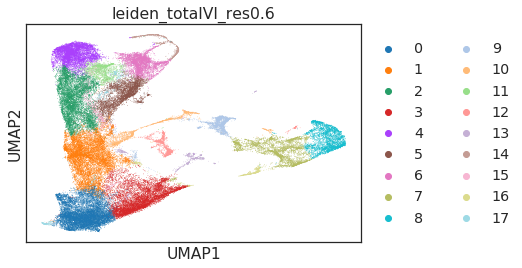

In [58]:
sc.pl.umap(
    post_adata, 
    color=["leiden_totalVI_res0.6"], 
    ncols = 1
)

In [100]:
Posclusters = [cluster in ["1", "2", "4", "5", "6", "11", "15"] for cluster in post_adata.obs["leiden_totalVI_res0.6"]]

In [101]:
np.sum(Posclusters) # cells after filtering for positive selecting clusters

35943

Trying to set attribute `.uns` of view, copying.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mappin

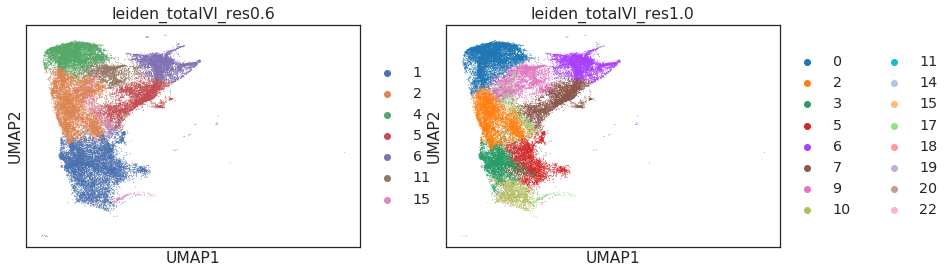

In [102]:
sc.pl.umap(
    post_adata[Posclusters, :], 
    color=["leiden_totalVI_res0.6", "leiden_totalVI_res1.0"],
    ncols = 2)

In [103]:
# Subset anndata to posclusters
pos_adata = post_adata[Posclusters, :]
pos_adata.shape

(35943, 5125)

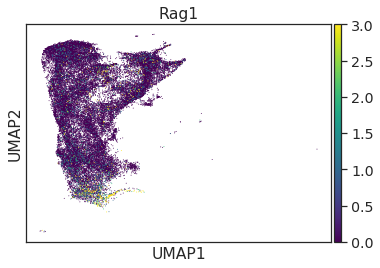

In [104]:
# Very low Rag1 expression at the start of the positive selection subset
sc.pl.umap(
    pos_adata, 
    color=["Rag1"],
    ncols = 3,
    vmax = "p99",
    cmap = "viridis"
)

In [105]:
# Save this subset and rerun totalVI finding more specific variable genes
pos_adata.write("posterior_adata_subset.h5ad", compression="gzip")

## Save output

In [106]:
post_adata

AnnData object with n_obs × n_vars = 72042 × 5125
    obs: 'batch_indices', 'percent_mito', 'n_counts', 'n_genes', 'n_protein_counts', 'n_proteins', 'batch', 'leiden_totalVI_res1.4', 'leiden_totalVI_res1.0', 'leiden_totalVI_res0.6', 'ADT_CD102_A0104_fore_prob', 'ADT_CD102_A0104', 'ADT_CD103_A0201_fore_prob', 'ADT_CD103_A0201', 'ADT_CD106_A0226_fore_prob', 'ADT_CD106_A0226', 'ADT_CD115(CSF-1R)_A0105_fore_prob', 'ADT_CD115(CSF-1R)_A0105', 'ADT_CD117(c-Kit)_A0012_fore_prob', 'ADT_CD117(c-Kit)_A0012', 'ADT_CD11a_A0595_fore_prob', 'ADT_CD11a_A0595', 'ADT_CD11c_A0106_fore_prob', 'ADT_CD11c_A0106', 'ADT_CD122(IL-2Rb)_A0227_fore_prob', 'ADT_CD122(IL-2Rb)_A0227', 'ADT_CD127(IL-7Ra)_A0198_fore_prob', 'ADT_CD127(IL-7Ra)_A0198', 'ADT_CD134(OX-40)_A0195_fore_prob', 'ADT_CD134(OX-40)_A0195', 'ADT_CD135_A0098_fore_prob', 'ADT_CD135_A0098', 'ADT_CD137_A0194_fore_prob', 'ADT_CD137_A0194', 'ADT_CD140a_A0573_fore_prob', 'ADT_CD140a_A0573', 'ADT_CD14_A0424_fore_prob', 'ADT_CD14_A0424', 'ADT_CD15(SSEA-1)_A

In [107]:
# Save posterior adata for full dataset
post_adata.write("posterior_adata.h5ad", compression="gzip")

In [108]:
# Extract dataframes from anndata

# Obsm (latent space, UMAP, denoised proteins, denoised genes)
latent_df = pd.DataFrame(post_adata.obsm["X_totalVI"])
umap_df = pd.DataFrame(post_adata.obsm["X_umap"])
denoised_proteins_df = pd.DataFrame(post_adata.obsm["denoised_proteins"])
raw_proteins_df = pd.DataFrame(post_adata.obsm["protein_expression"])

# Uns (gene and protein names)
totalVI_genes_df = pd.DataFrame(post_adata.uns["totalVI_genes"])
totalVI_proteins_df = pd.DataFrame(post_adata.uns["totalVI_proteins"])

# X (the gene data matrix)
raw_genes_df = pd.DataFrame(post_adata.X)

# Obs
obs_df = pd.DataFrame(post_adata.obs)

In [109]:
# Write csvs for analysis in R, compress with .gz
# Note: this will take a few minutes. Avoid running this multiple times (only necessary to save the raw data once).
save_path = "/data/yosef2/users/zsteier/TotalSeq/20190814_BioLegend_ZRS08/analysis/totalVI_thymus/thymus111_allbatches_stable/totalVI_results/"

latent_df.to_csv(save_path + "latent.csv.gz")
umap_df.to_csv(save_path + "umap.csv.gz")
denoised_proteins_df.to_csv(save_path + "denoised_proteins.csv.gz")
raw_proteins_df.to_csv(save_path + "raw_proteins.csv.gz")
totalVI_genes_df.to_csv(save_path + "totalVI_genes.csv.gz")
totalVI_proteins_df.to_csv(save_path + "totalVI_proteins.csv.gz")
raw_genes_df.to_csv(save_path + "raw_genes.csv.gz")
obs_df.to_csv(save_path + "obs.csv.gz", index = True)